In [1]:
import os
import cv2
from ultralytics import YOLOv10
import supervision as sv

#### Show CLASS_NAME and their ID

In [ ]:

model = YOLOv10('F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt') # yolov3-v7
model.names

## TEST MODEL WITH FRAME

In [2]:

# Initialize model
model_path = 'F:\\BigData\\Traffic_Violation_Detection\\data\\models\\best.pt'
model = YOLOv10(model_path)

# Path to the folder containing images
image_folder_path = 'F:\\BigData\\Traffic_Violation_Detection\\data\\tmp'

# Define annotators
bounding_box_annotator = sv.BoundingBoxAnnotator()
label_annotator = sv.LabelAnnotator()





0: 384x640 4 helmets, 3 motorbikes, 1 red, 335.7ms
Speed: 15.0ms preprocess, 335.7ms inference, 15.0ms postprocess per image at shape (1, 3, 384, 640)
[7 5 5 4 5 4 4 4]


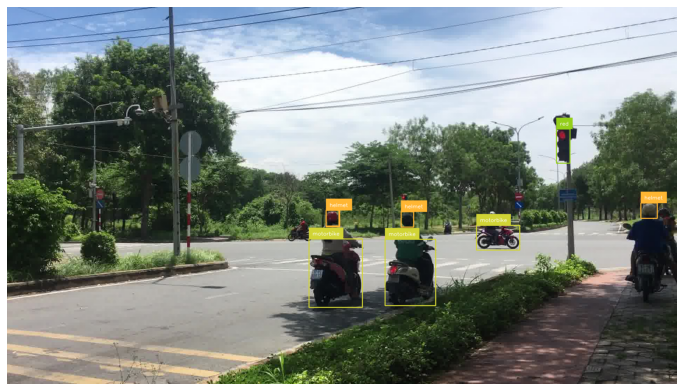


0: 288x640 1 helmet, 1 yellow, 221.2ms
Speed: 3.0ms preprocess, 221.2ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)
[8 4]


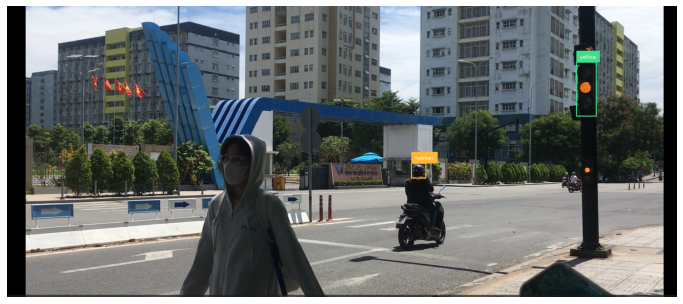


0: 288x640 2 helmets, 1 motorbike, 1 red, 165.6ms
Speed: 3.0ms preprocess, 165.6ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)
[5 7 4 4]


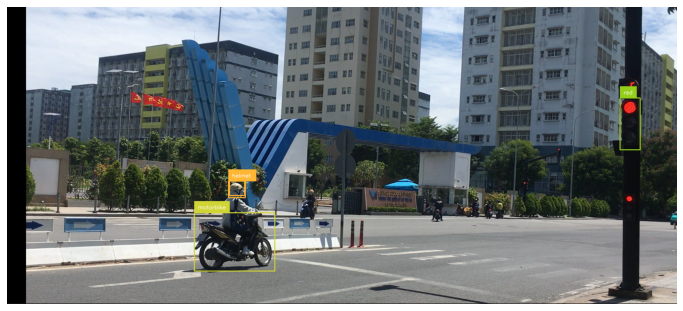


0: 320x640 2 greens, 9 helmets, 3 motorbikes, 330.3ms
Speed: 3.0ms preprocess, 330.3ms inference, 2.0ms postprocess per image at shape (1, 3, 320, 640)
[3 4 4 4 5 4 4 4 3 4 5 5 4 4]


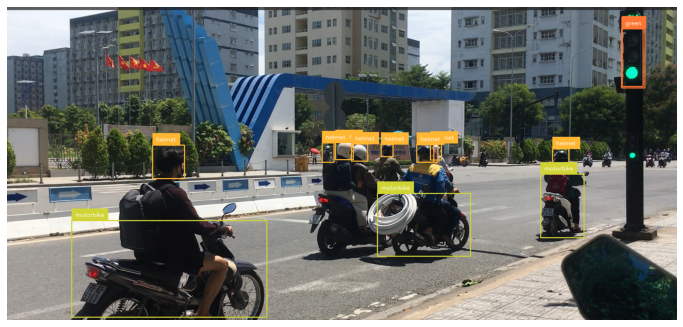


0: 640x640 6 btrls, 7 helmets, 1 motorbike, 1 no_helmet, 382.3ms
Speed: 7.4ms preprocess, 382.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[0 4 0 0 5 0 4 4 4 4 4 0 0 4 6]


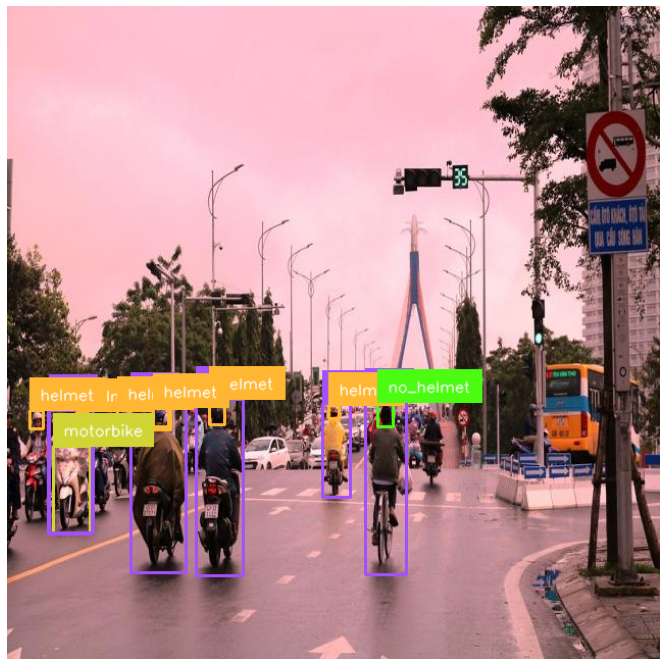


0: 640x640 2 helmets, 1 motorbike, 428.6ms
Speed: 6.0ms preprocess, 428.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 4 4]


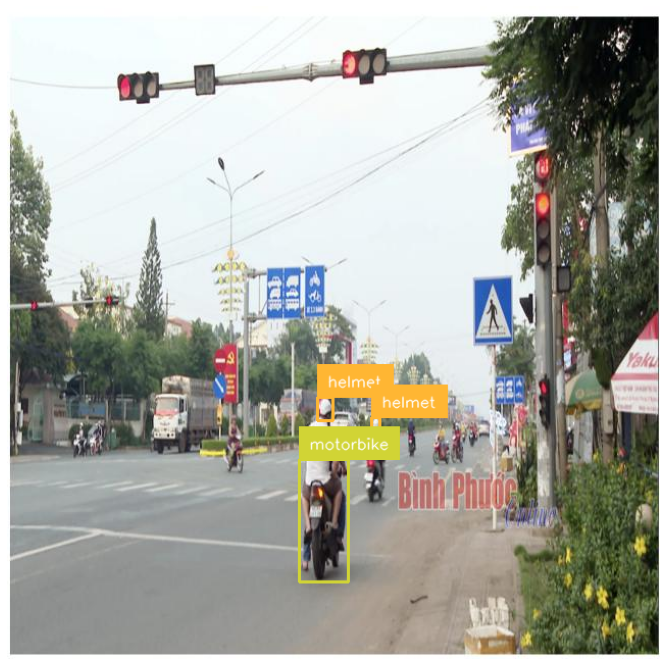


0: 640x640 2 helmets, 2 motorbikes, 329.2ms
Speed: 5.0ms preprocess, 329.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 4 4]


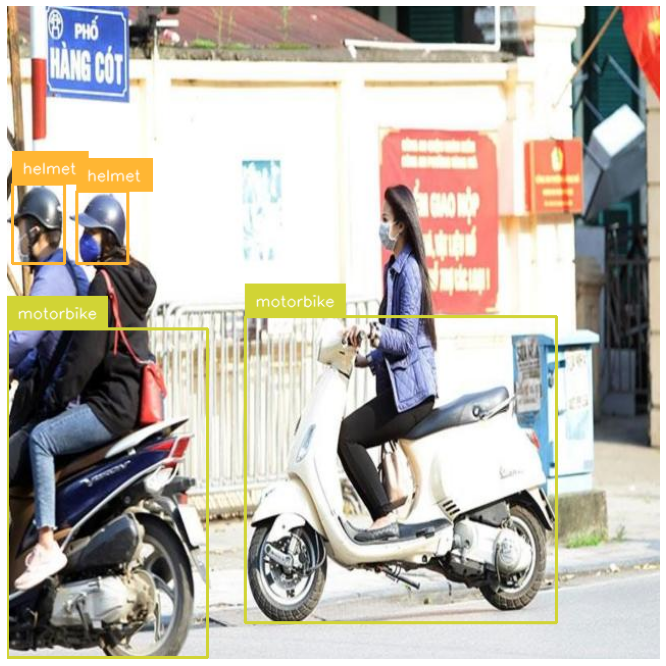


0: 640x640 1 helmet, 3 motorbikes, 3 no_helmets, 459.8ms
Speed: 6.0ms preprocess, 459.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 6 5 4 6 6]


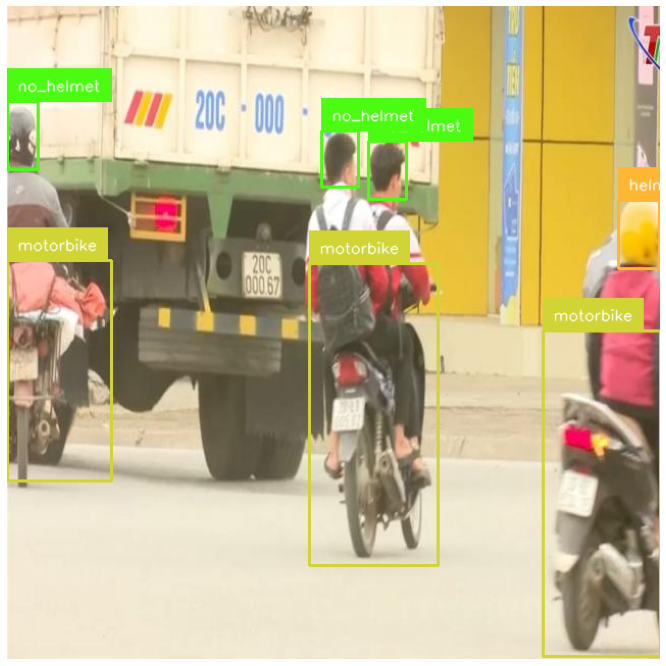


0: 640x640 2 motorbikes, 1 no_helmet, 339.2ms
Speed: 6.0ms preprocess, 339.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[5 5 6]


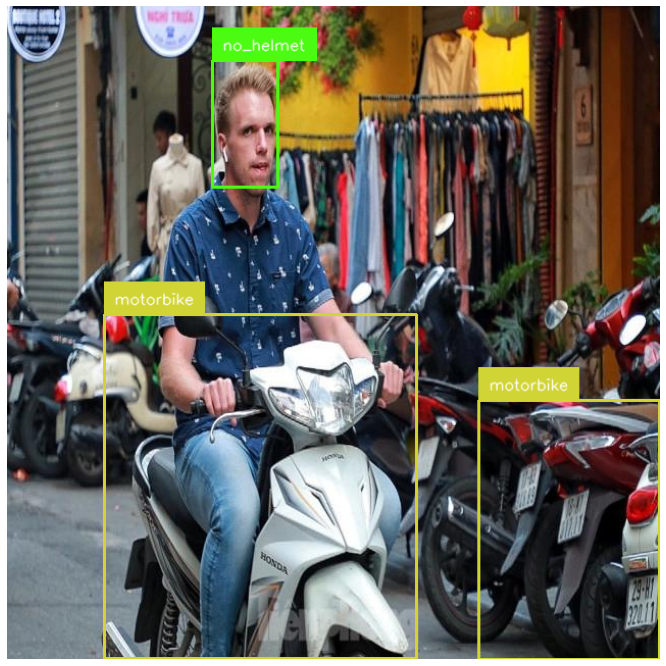


0: 640x640 1 car, 3 motorbikes, 4 no_helmets, 466.5ms
Speed: 5.1ms preprocess, 466.5ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[5 2 6 5 6 6 5 6]


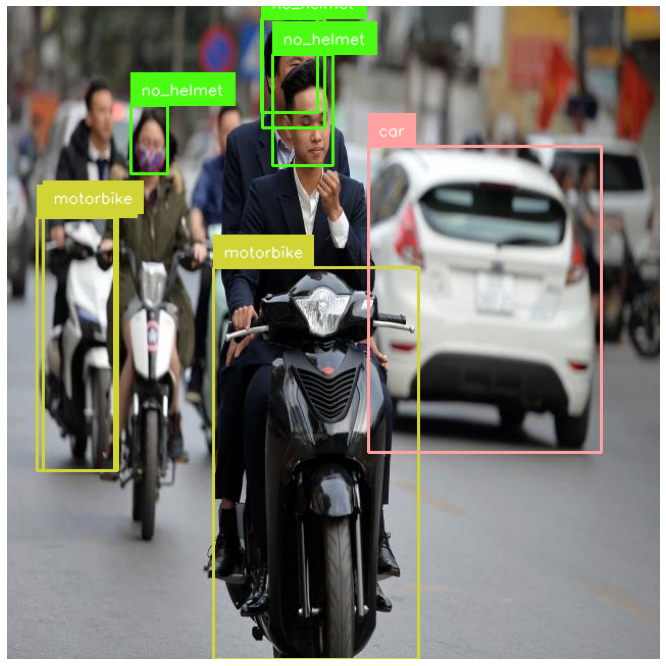


0: 640x640 1 motorbike, 3 no_helmets, 314.7ms
Speed: 6.0ms preprocess, 314.7ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
[6 5 6 6]


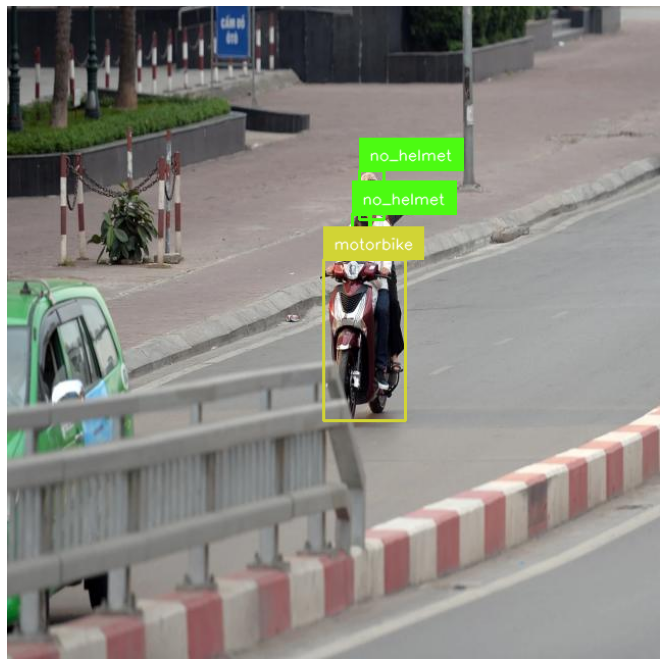


0: 640x640 2 motorbikes, 2 no_helmets, 481.3ms
Speed: 5.0ms preprocess, 481.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
[5 6 5 6]


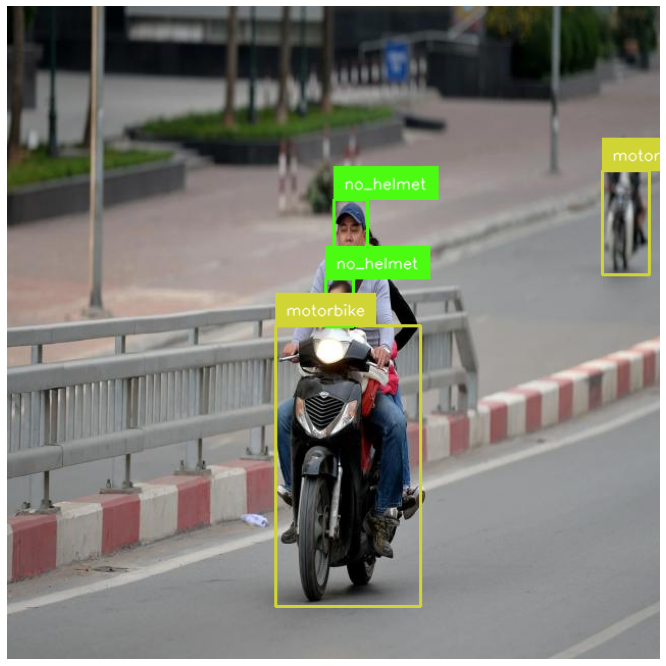


0: 640x640 2 motorbikes, 1 no_helmet, 328.6ms
Speed: 5.0ms preprocess, 328.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)
[5 6 5]


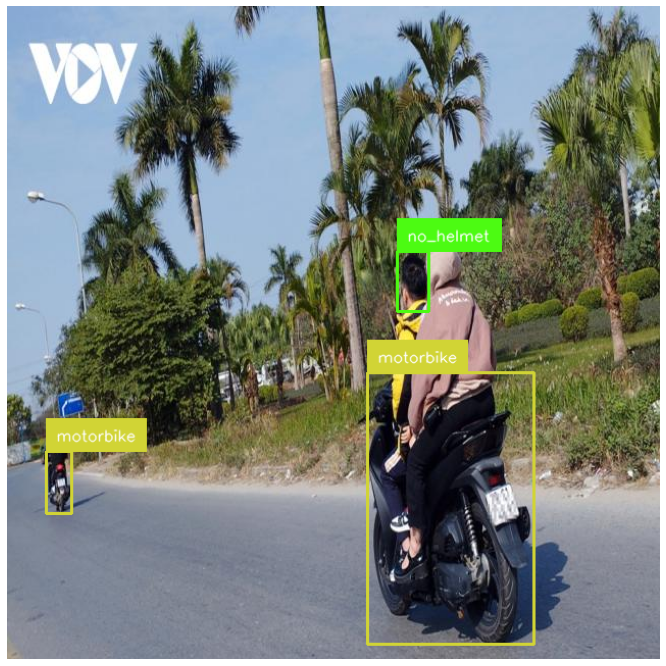

In [3]:
# Process each image in the folder
for filename in os.listdir(image_folder_path):
    if filename.endswith(('.png', '.jpg', '.jpeg')):
        image_path = os.path.join(image_folder_path, filename)
        image = cv2.imread(image_path)

        results = model(image)[0]
        detections = sv.Detections.from_ultralytics(results)

        annotated_image = bounding_box_annotator.annotate(scene=image, detections=detections)
        annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)
        #print class_id
        print(detections.class_id)
        sv.plot_image(annotated_image)

In [7]:
import cv2
import base64
from pymongo import MongoClient
import matplotlib.pyplot as plt
import numpy as np
client = MongoClient('localhost', 27017)
db = client['traffic_violation']
collection = db['violations']


## Show IMG FROM MONGO

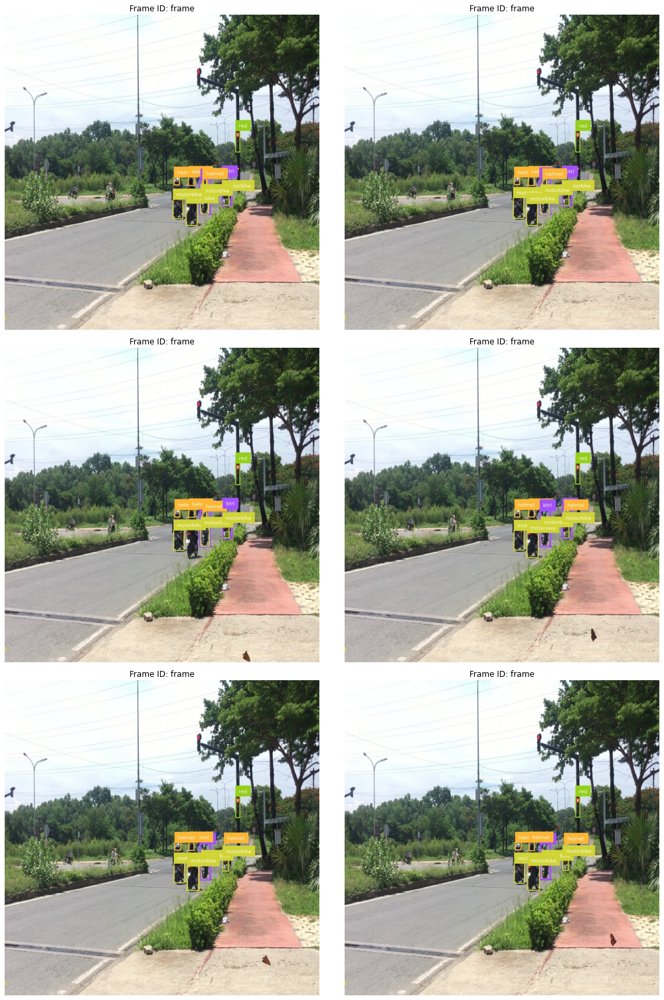

In [18]:


def plot_all_images_from_mongodb(number_of_images=6):
    # collection "violations"
    cursor = collection.find().limit(number_of_images)
    
    # count rows
    num_rows = (number_of_images + 1) // 2
    
    # subplot network
    fig, axes = plt.subplots(num_rows, 2, figsize=(15, num_rows * 7))
    
    for i, document in enumerate(cursor):
        frame_id = document['frame_id']
        frame_base64 = document['frame']
        
        # decode base64
        frame_bytes = base64.b64decode(frame_base64)
        
        # bytes to numpy array
        np_arr = np.frombuffer(frame_bytes, np.uint8)
        frame = cv2.imdecode(np_arr, cv2.IMREAD_COLOR)
        
        # BGR to RGB
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # show img
        row, col = divmod(i, 2)
        axes[row, col].imshow(frame)
        axes[row, col].set_title(f'Frame ID: {frame_id}')
        axes[row, col].axis('off')
    
    # 
    for j in range(i + 1, num_rows * 2):
        row, col = divmod(j, 2)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

plot_all_images_from_mongodb()
